# 3D Plots ATL03 Data

In [1]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from datetime import datetime
from dateutil.relativedelta import *
import dask.dataframe as dd
import matplotlib.pyplot as plt

In [2]:
def merge_df_nmonths(directory, start_date, nmonths:int, file_names):
    
    # Select nmonths for time series
    start_date = datetime.strptime(start_date, '%m-%d-%Y').date()
    end_date = start_date+relativedelta(months=+nmonths)
    
    df_list = []

    # Create dask dataframe for data between desired nmonths
    df_list = map(lambda file_name: dd.read_hdf(f'{directory}{file_name}*.hdf', '*').loc[lambda df: df.Date.between(f'{start_date}', f'{end_date}')], file_names)
   
    # Compute the results using multiple processes
    df_list = [df.compute(scheduler='processes') for df in df_list]

    return (df_list)

In [3]:
def Plot3D_df_x_nmonths(directory, start_date, end_date, nmonths:int, file_names):
    
    # Parse the start date as a datetime object
    start_date = datetime.strptime(start_date, '%m-%d-%Y')
    end_date = datetime.strptime(end_date, '%m-%d-%Y')
    
    # Add the number of months to the start date until the new date is before the end date
    while start_date < end_date:
        start_date += relativedelta(months=nmonths)
        # Convert the datetime object to a string in the specified format
        date_str = start_date.strftime('%m-%d-%Y')
        #function to merge all data into df and select nmonths required
        df_Ground, df_TOC = merge_df_nmonths(directory, start_date=date_str, nmonths=nmonths, file_names=file_names)
        
        # 3D plot Ground + TOC
        fig = plt.figure(figsize=(20, 20))
        fig.suptitle(f'3D Plot Ground & TOC {date_str} +{nmonths} months')
        ax = plt.axes(projection='3d')
        ax.scatter3D(df_Ground['Easting'], df_Ground['Northing'], df_Ground['Ground_Height'], color='black', s=1)
        ax.scatter3D(df_TOC['Easting'], df_TOC['Northing'], df_TOC['Ground_interp_Height']+df_TOC['TOC_Height'], s=5, c=df_TOC['TOC_Height'], cmap='viridis', alpha=0.7)
        ax.view_init(50, 20)
        fig.savefig(f'../JupyterNotebooks/Plot3D/plot3d_TOC_{date_str}_{nmonths}.png')
        plt.show()


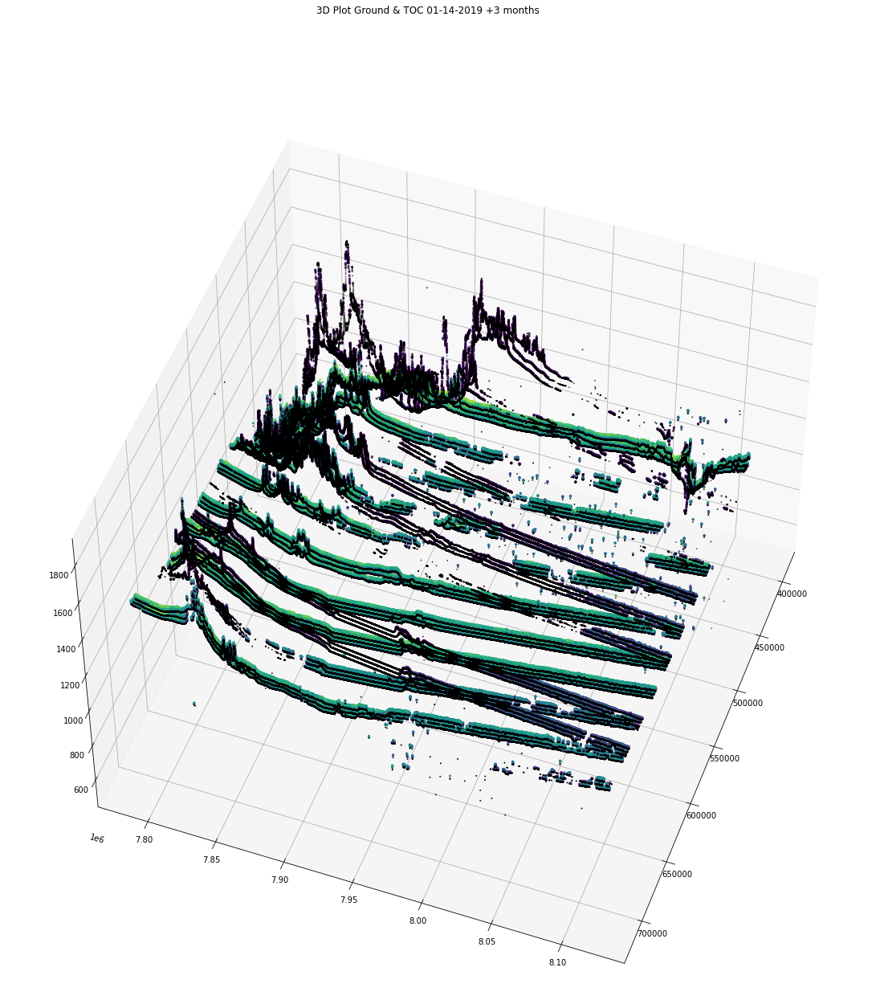

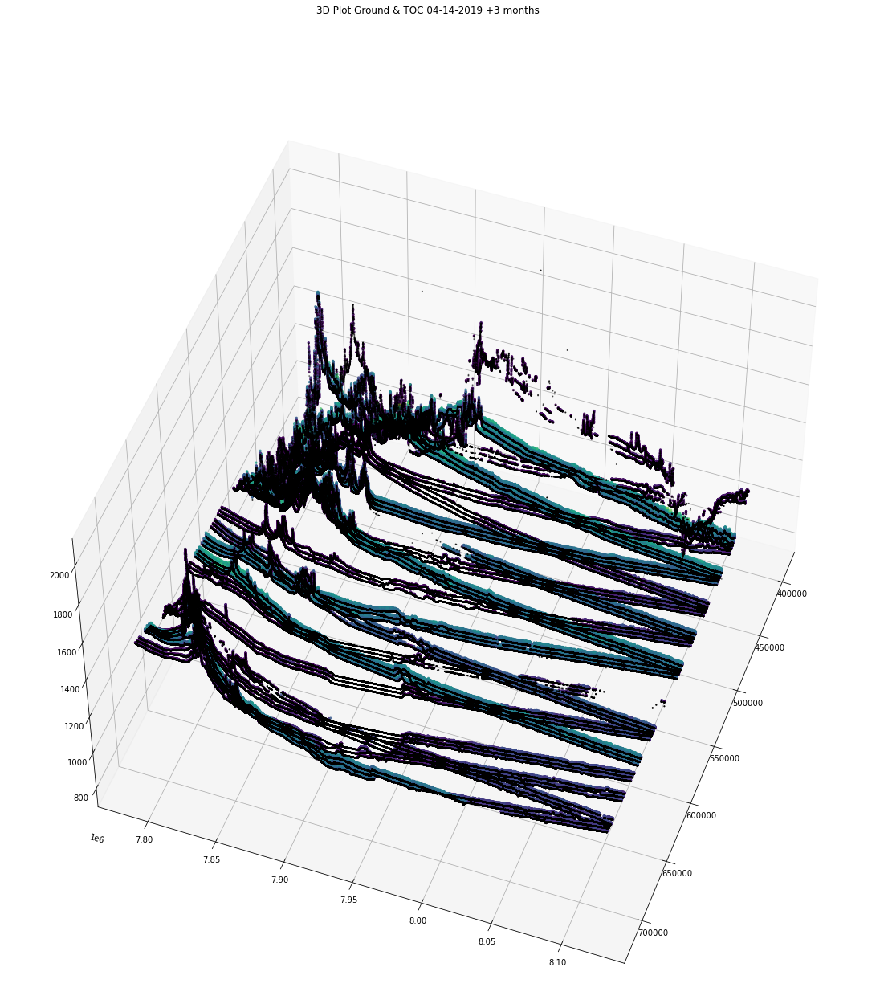

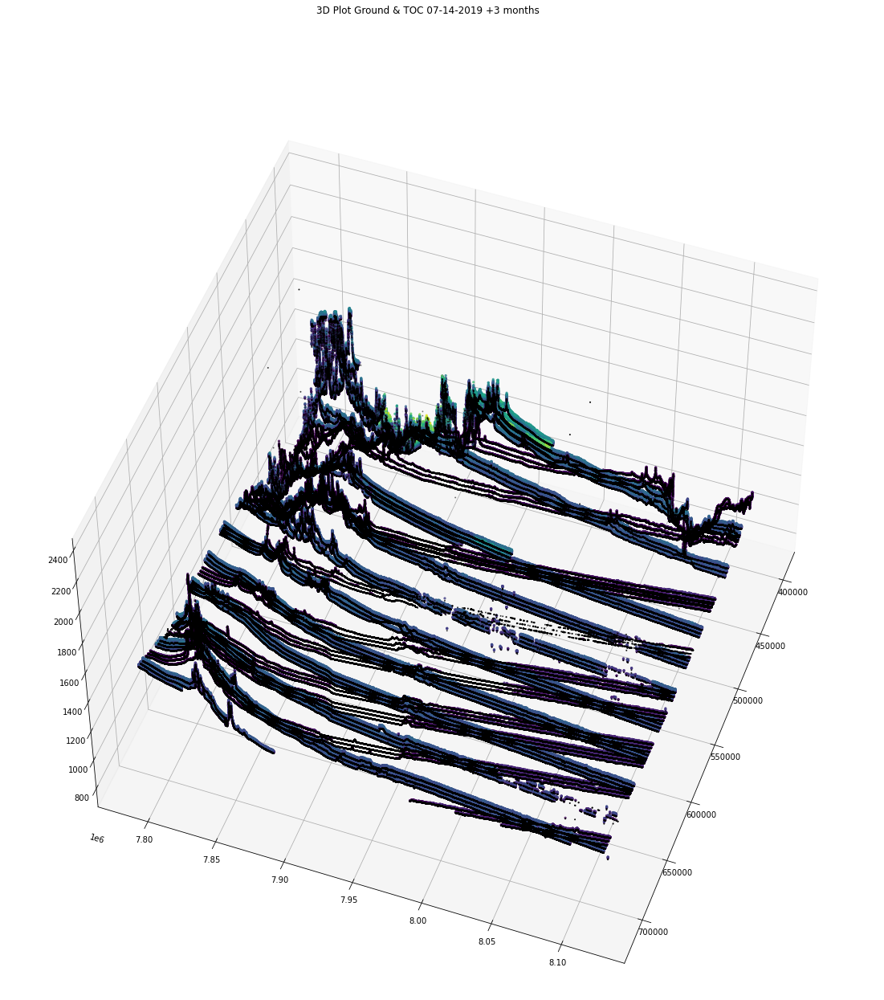

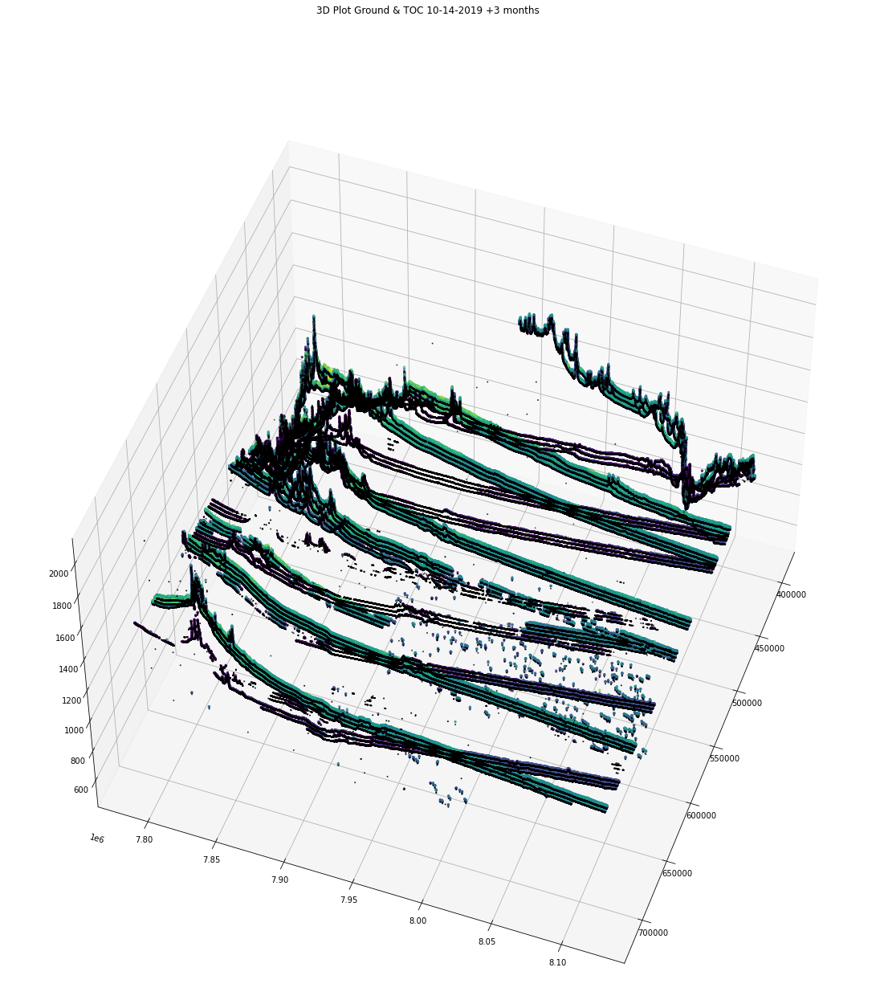

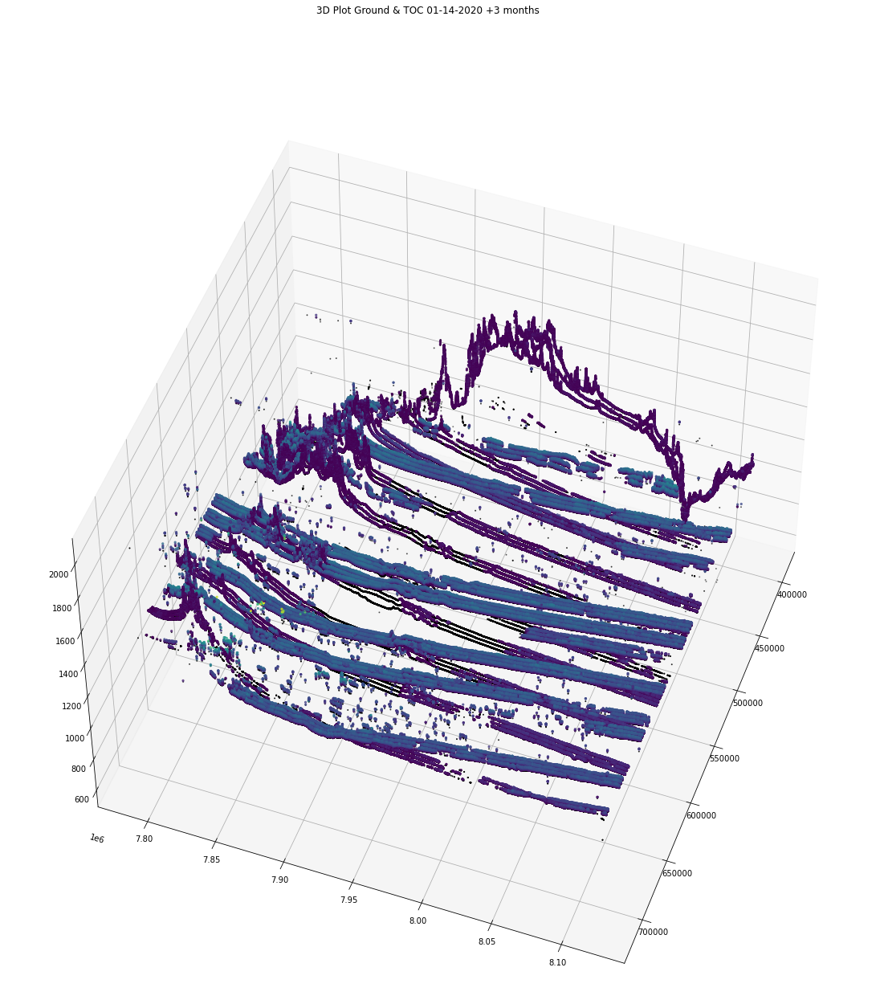

...

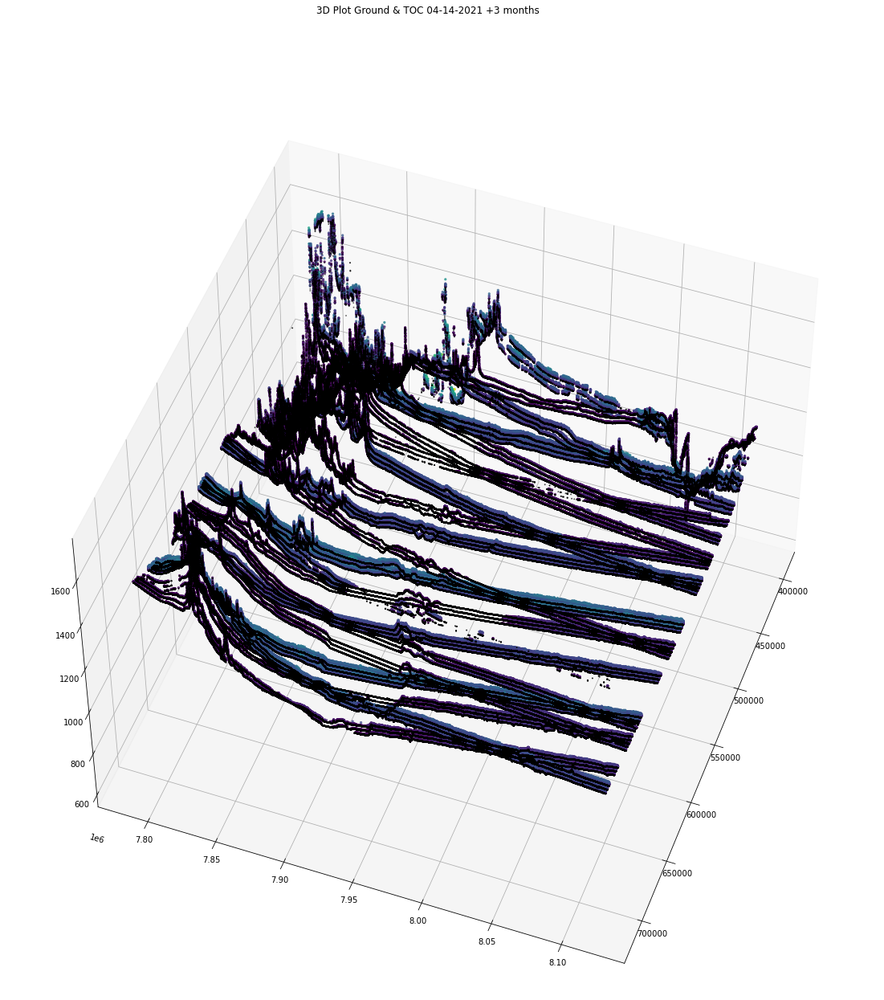

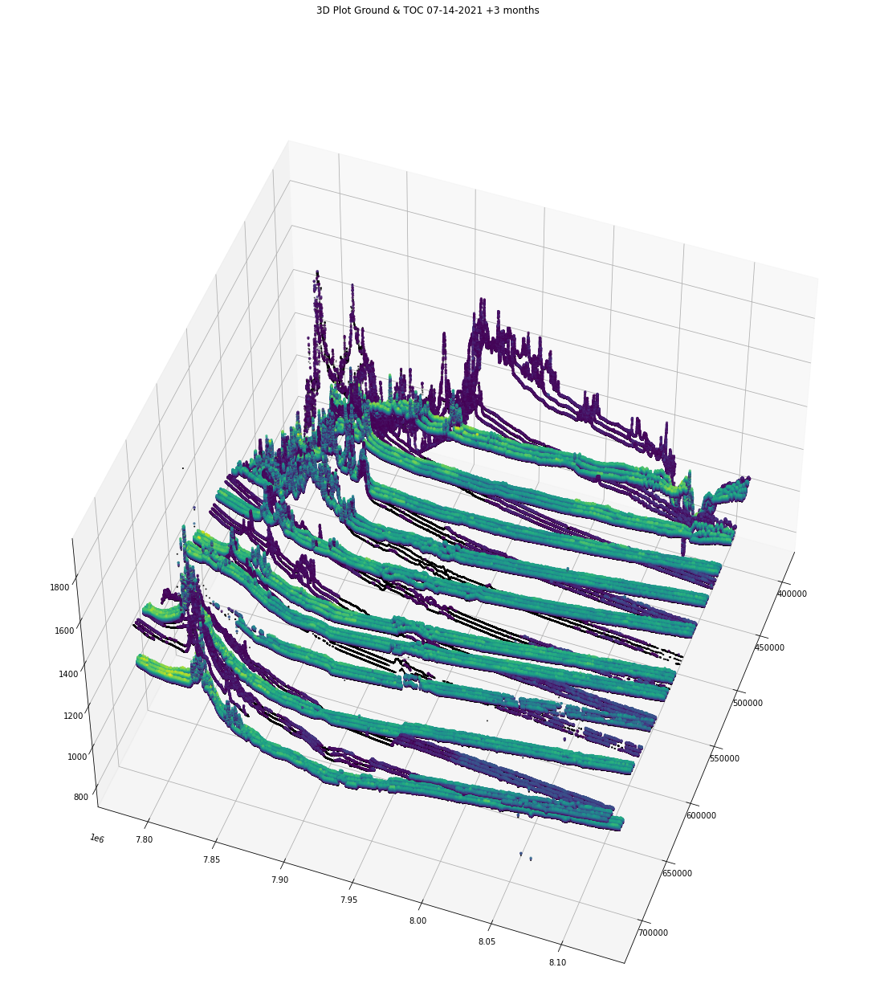

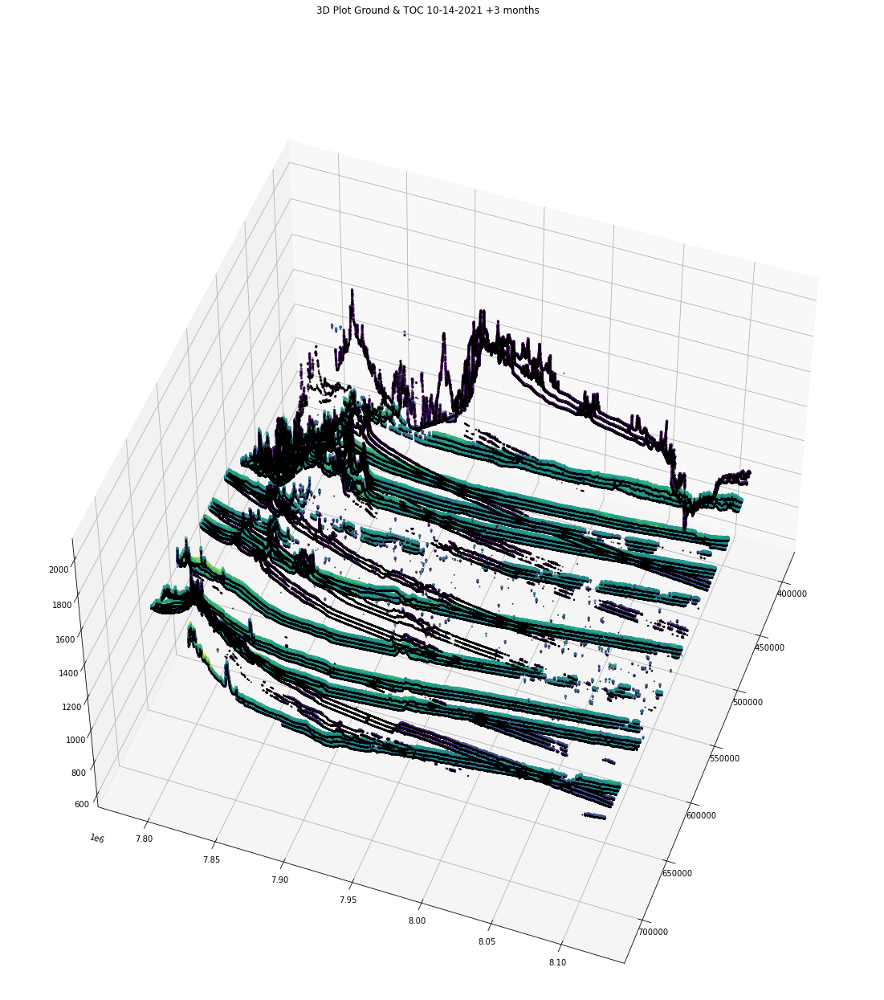

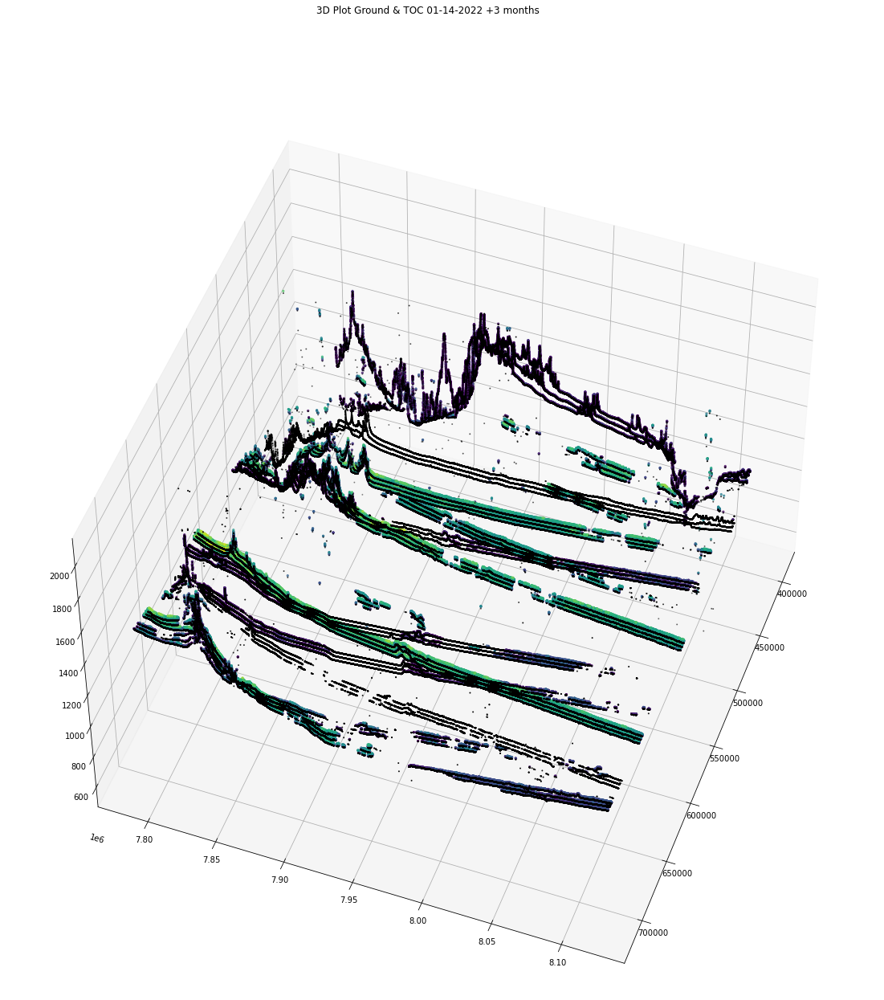

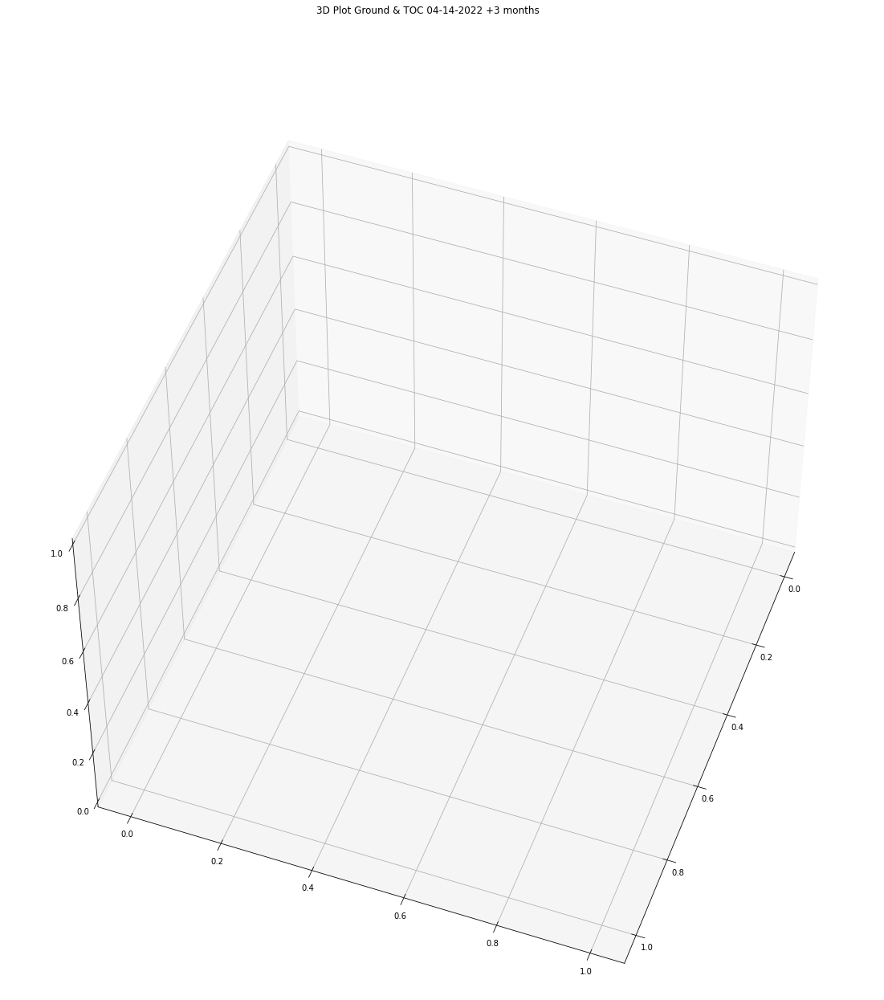

In [4]:
# Set the start date and end date
start_date = '10-14-2018'
end_date = '03-13-2022'
nmonths = 3

# Directory and files needed
directory = '/DATA/magalhaes/icesat2_atl03/atl03_hdf_dates/'
file_names = ['ATL03_Ground', 'ATL03_TOC']

# Plot using function
Plot3D_df_x_nmonths(directory, start_date=start_date, end_date=end_date, nmonths=nmonths, file_names=file_names)

---

In [5]:
def Plot3D_df_x_nmonths(directory, start_date, end_date, nmonths:int, file_names):
    
    # Parse the start date as a datetime object
    start_date = datetime.strptime(start_date, '%m-%d-%Y')
    end_date = datetime.strptime(end_date, '%m-%d-%Y')
    
    # Add the number of months to the start date until the new date is before the end date
    while start_date < end_date:
        start_date += relativedelta(months=nmonths)
        # Convert the datetime object to a string in the specified format
        date_str = start_date.strftime('%m-%d-%Y')
        #function to merge all data into df and select nmonths required
        df_Ground, df_PreCanopy = merge_df_nmonths(directory, start_date=date_str, nmonths=nmonths, file_names=file_names)
        
        # 3D plot Ground + PreCanopy
        fig = plt.figure(figsize=(15, 15))
        fig.suptitle(f'3D Plot Ground & PreCanopy {date_str} +{nmonths} months')
        ax = plt.axes(projection='3d')
        ax.scatter3D(df_Ground['Easting'], df_Ground['Northing'], df_Ground['Ground_Height'], color='black', s=1)
        ax.scatter3D(df_PreCanopy['Easting'], df_PreCanopy['Northing'], df_PreCanopy['Ground_interp_Height']+df_PreCanopy['PreCanopy_Height'], s=5, c=df_PreCanopy['PreCanopy_Height'], cmap='viridis', alpha=0.7)
        ax.view_init(50, 20)
        fig.savefig(f'../JupyterNotebooks/Plot3D/plot3d_PreCanopy_{date_str}_{nmonths}.png')
        plt.show()

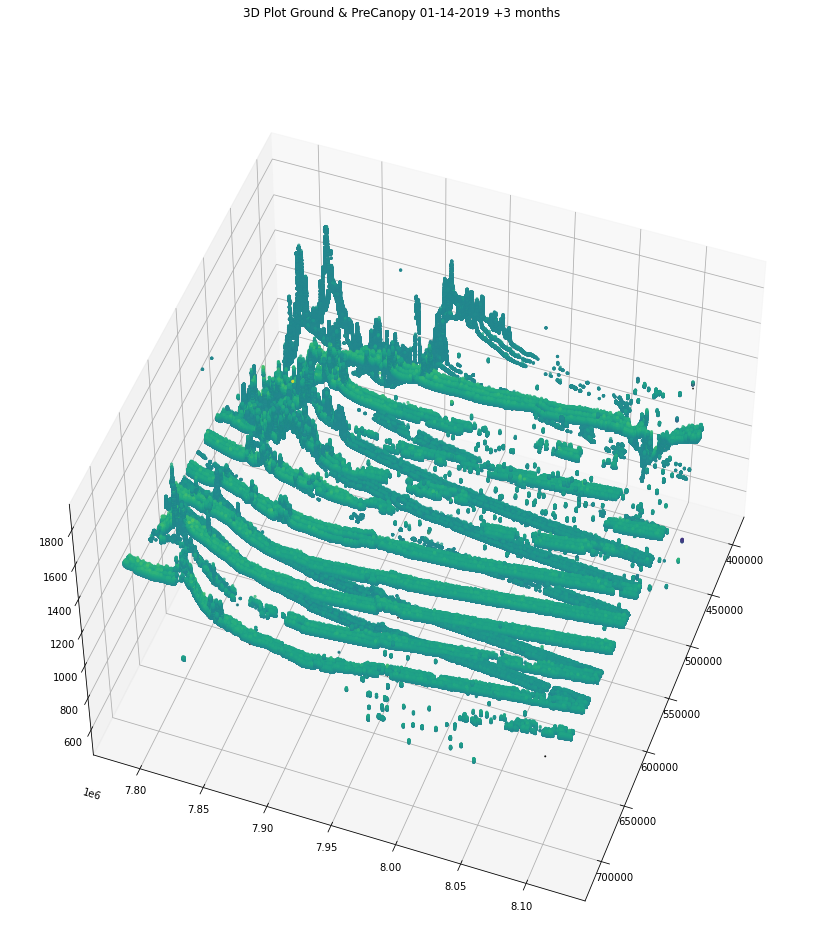

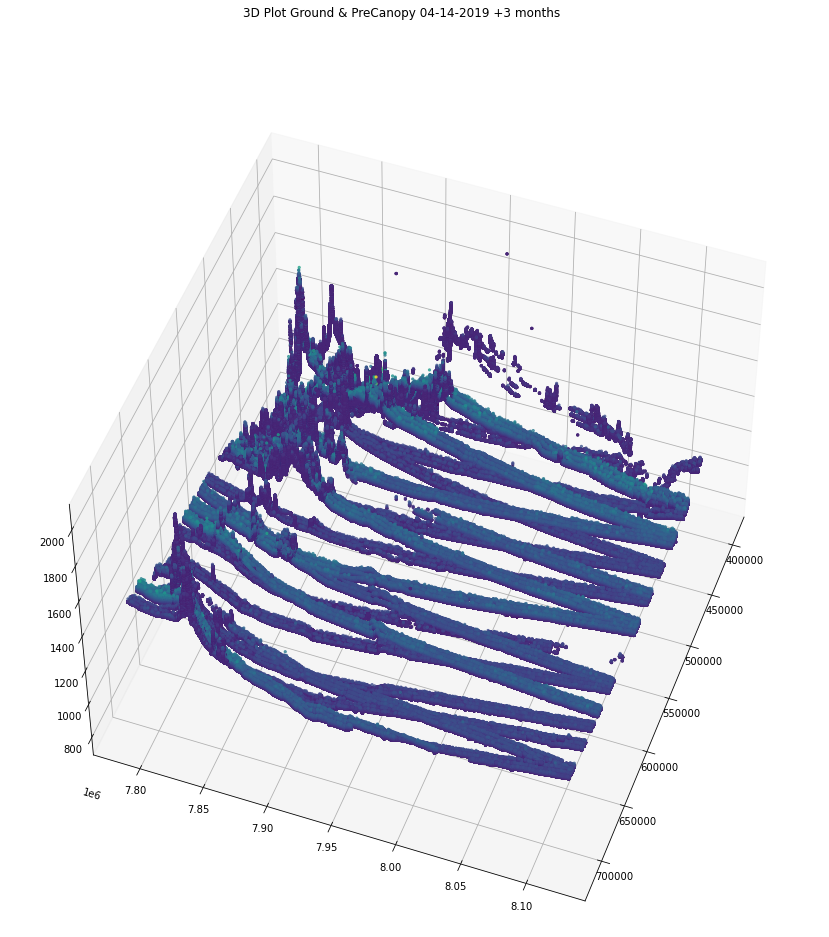

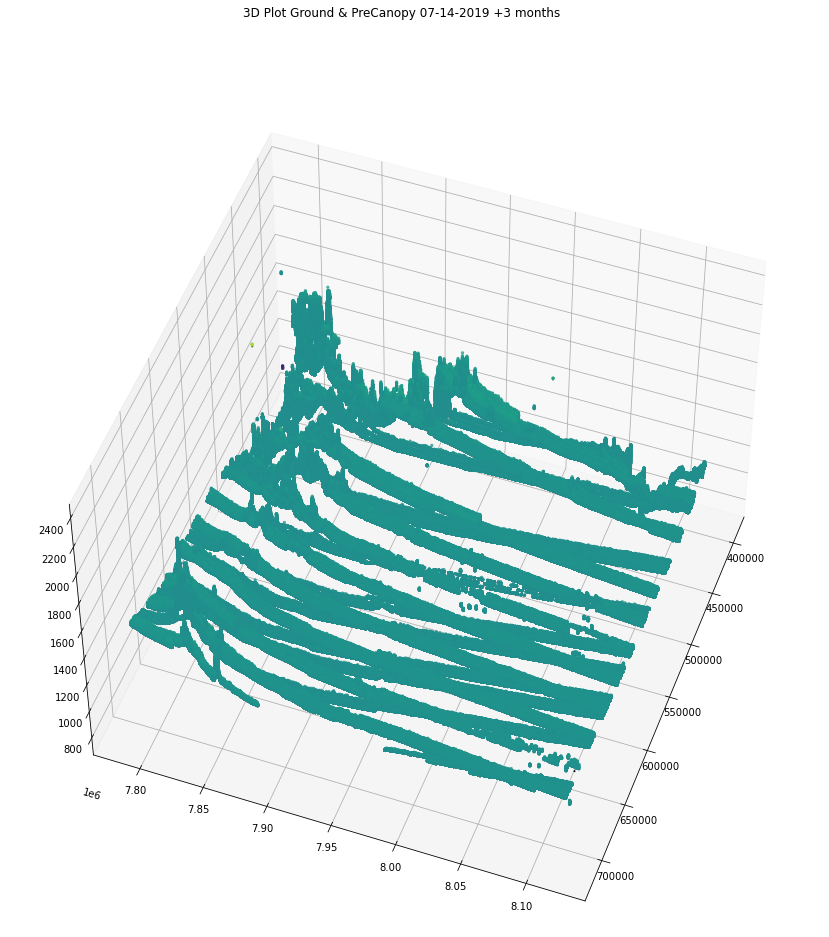

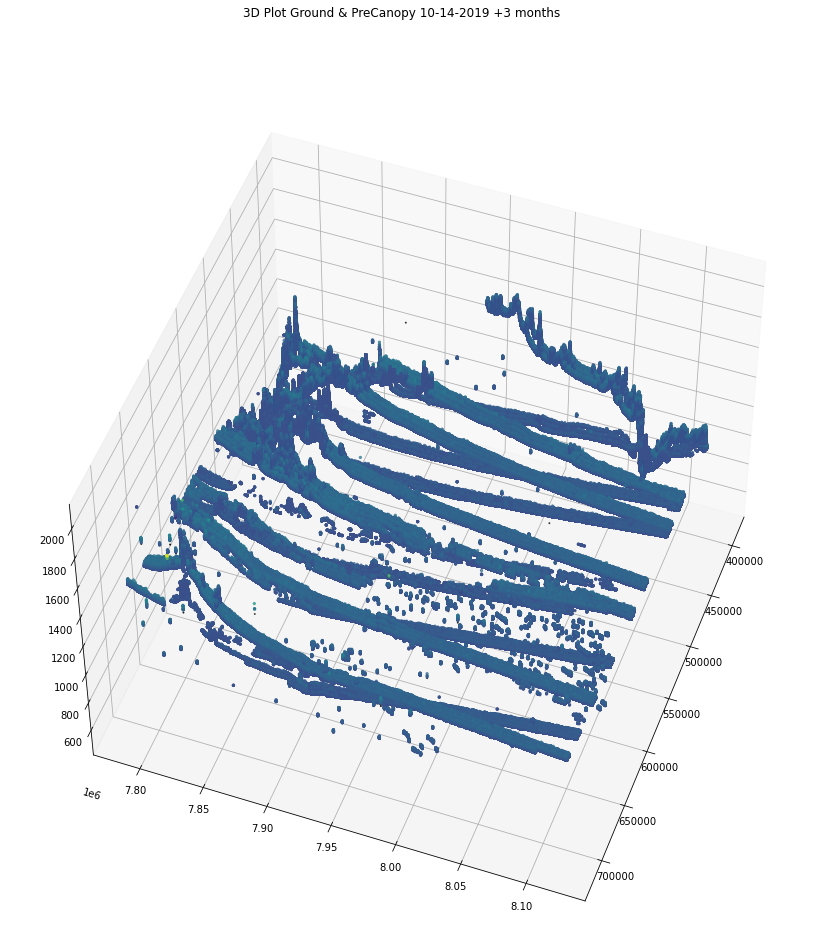

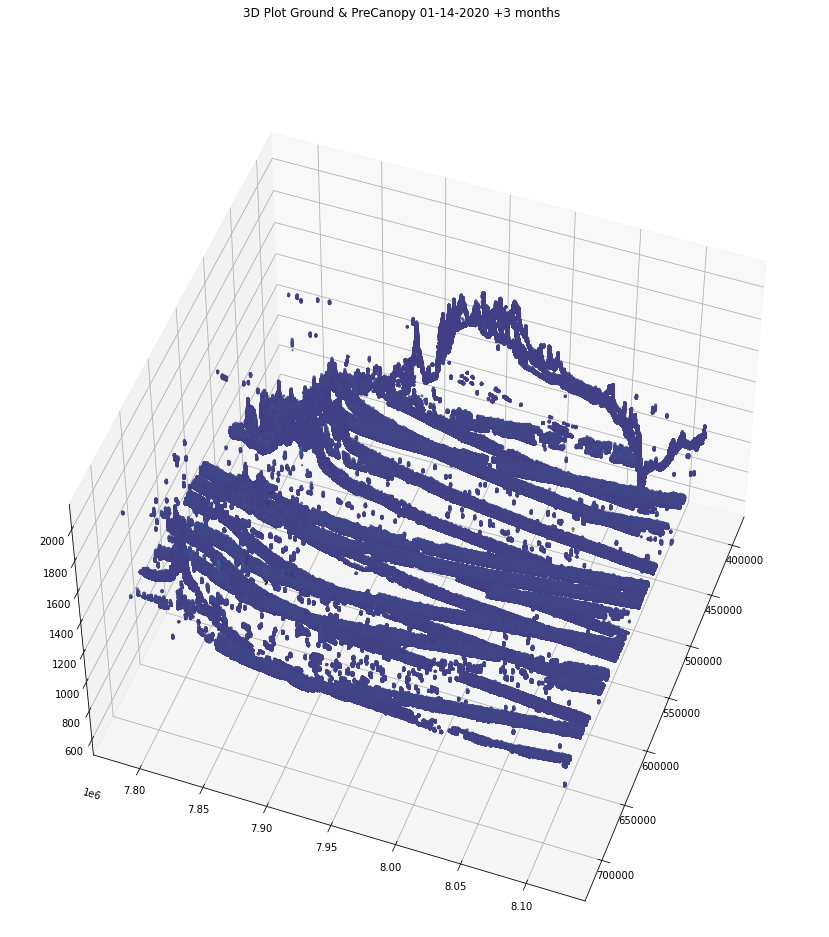

...

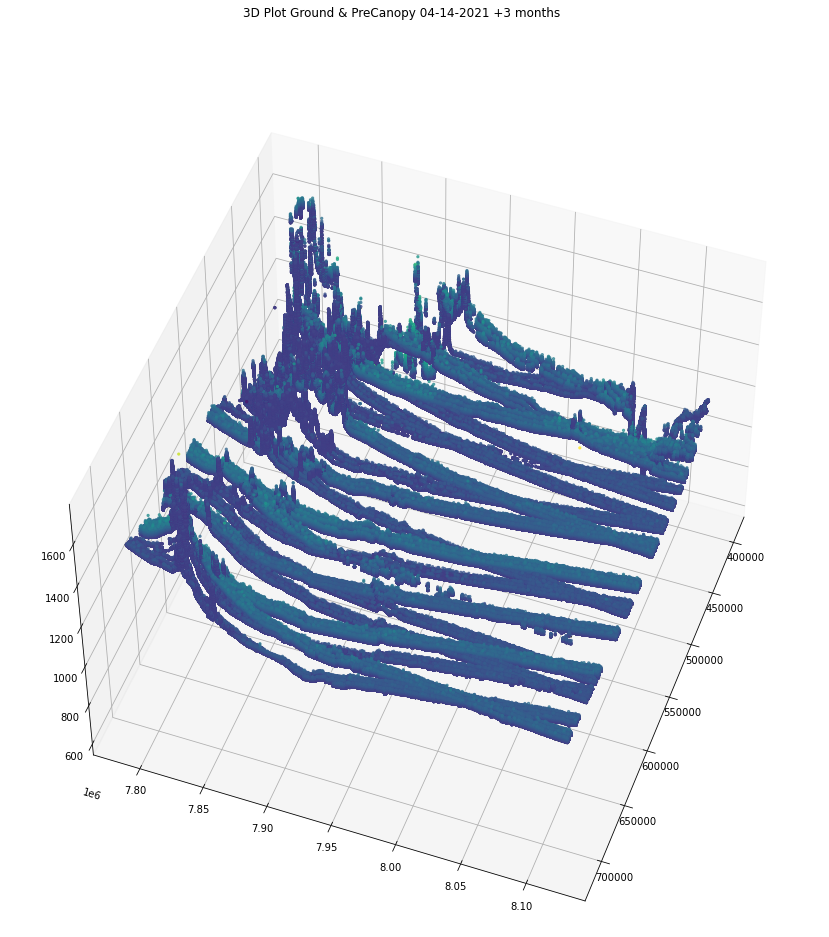

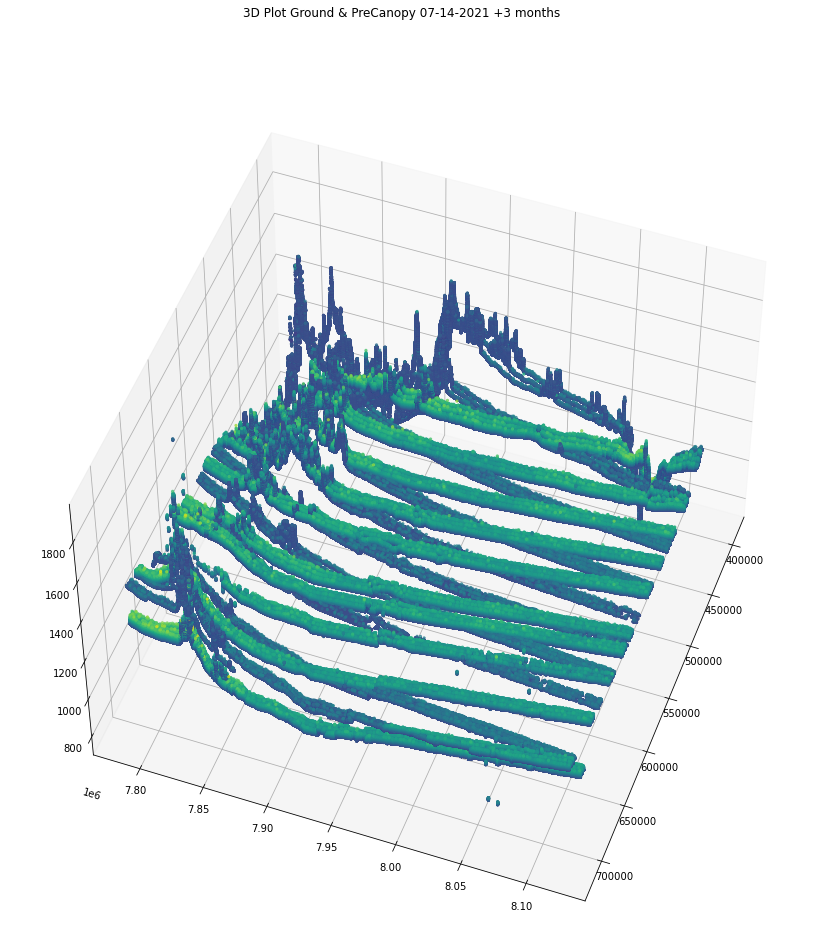

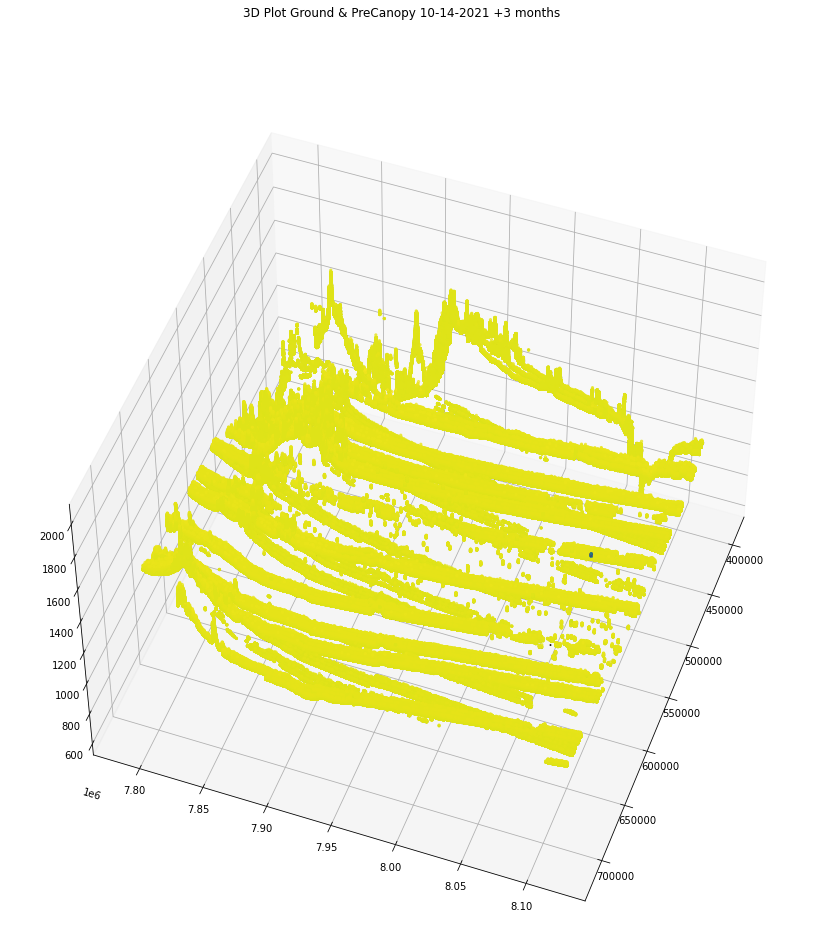

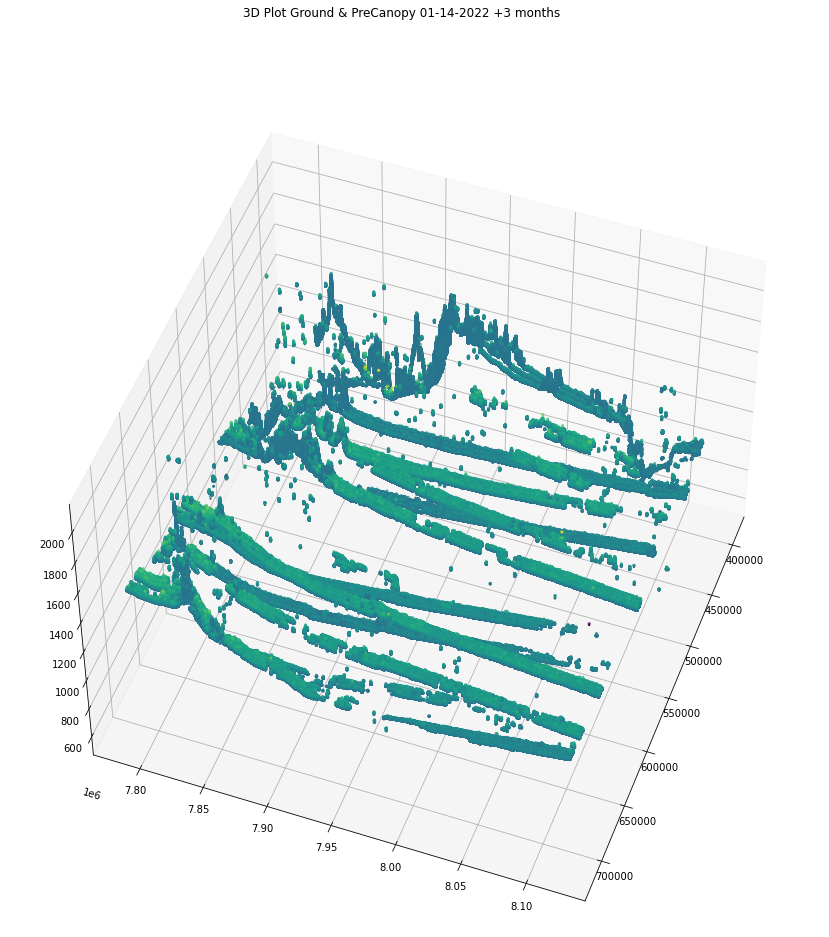

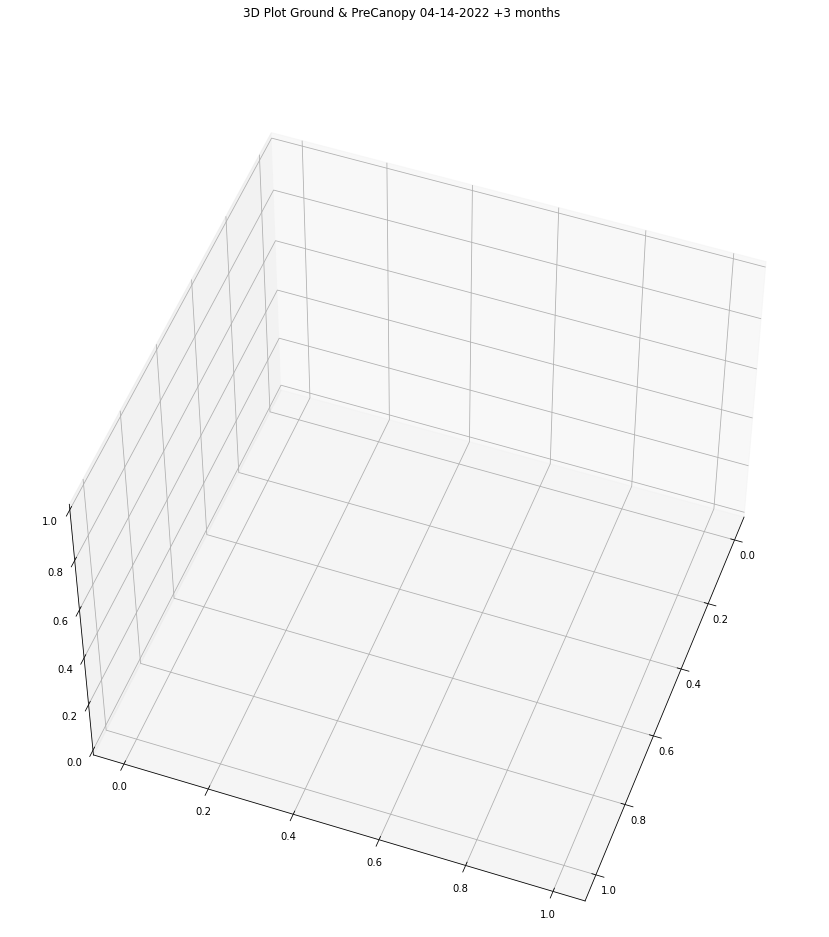

In [6]:
# Set the start date and end date
start_date = '10-14-2018'
end_date = '03-13-2022'
nmonths = 3

# Directory and files needed
directory = '/DATA/magalhaes/icesat2_atl03/atl03_hdf_dates/'
file_names = ['ATL03_Ground', 'ATL03_PreCanopy']

# Plot using function
Plot3D_df_x_nmonths(directory, start_date=start_date, end_date=end_date, nmonths=nmonths, file_names=file_names)

---

# Steps

1. merge all .hf files into one dataframe
2. select date period of data (parameter should be adjustable on function)
3. create a loop with start_date running for the required number of months
4. plot data inside this loop until all data is covered


--- 

## 3D Plot example using 1 month of data

In [13]:
from dateutil.relativedelta import *
from datetime import datetime
import dask.dataframe as dd


def select_df_period(directory, start_date, period:int, file_names):
    
    # Select period for time series
    start_date = datetime.strptime(start_date, '%m-%d-%Y').date()
    end_date = start_date+relativedelta(months=+period)
    
    df_list = []

    # Create dask dataframe for data between desired period
    df_list = map(lambda file_name: dd.read_hdf(f'{directory}{file_name}*.hdf', '*').loc[lambda df: df.Date.between(f'{start_date}', f'{end_date}')], file_names)
   
    # Compute the results using multiple processes
    df_list = [df.compute(scheduler='processes') for df in df_list]

    return (df_list)

In [14]:
directory = '/DATA/magalhaes/icesat2_atl03/atl03_hdf_dates/'

# file_names = ['ATL03_Ground', 'ATL03_TOC', 'ATL03_GrassHeight'] #period=1 8min

# file_names = ['ATL03_Land', 'ATL03_Ground', 'ATL03_TOC', 'ATL03_PreCanopy', 'ATL03_GrassHeight'] #period=1 50 min for all

file_names = ['ATL03_Ground', 'ATL03_PreCanopy', 'ATL03_GrassHeight'] #period=1 13.9 sec for TOC and Grass

In [ ]:
%%time 
df_list = select_df_period(directory, start_date='10-14-2018', period=1, file_names=file_names)

In [ ]:
# Unpack the list of dataframes into separate variables

df_Ground, df_PreCanopy, df_GrassHeight = df_list

# df_Land, df_Ground, df_TOC, df_PreCanopy, df_GrassHeight = df_list

In [19]:
df_PreCanopy.head()

,Latitude,Longitude,Along-track_Distance,Land,Easting,Northing,crosstrack,alongtrack,Ground_interp_Height,PreCanopy_Height,Date
142468,-17.000112,15.857248,16.866951,4.0,591251.034898,8.120233e+06,2305.968677,1.105782e+06,1134.146653,0.082717,2018-10-14
142470,-17.000157,15.857243,1.844424,4.0,591250.519457,8.120228e+06,2305.972952,1.105787e+06,1134.161130,1.126101,2018-10-14
142474,-17.000221,15.857237,8.989001,4.0,591249.804917,8.120221e+06,2305.957180,1.105794e+06,1134.205056,0.150169,2018-10-14
142475,-17.000221,15.857237,8.988578,4.0,591249.806013,8.120221e+06,2305.956092,1.105794e+06,1134.205055,0.025536,2018-10-14
142476,-17.000266,15.857232,13.993023,4.0,591249.293477,8.120216e+06,2305.957162,1.105799e+06,1134.250330,0.749426,2018-10-14


In [18]:
df_GrassHeight.head()

,Latitude,Longitude,Along-track_Distance,Land,Easting,Northing,crosstrack,alongtrack,Ground_interp_Height,Grass_Height,z,x,NN,Date
142831,-17.006168,15.856624,9.563341,4.0,591181.663315,8.119563e+06,2306.505033,1.106455e+06,1135.218863,0.540293,0.016118,0.002004,7.0,2018-10-14
142878,-17.006975,15.856539,19.189495,4.0,591172.233553,8.119474e+06,2306.765878,1.106545e+06,1135.705776,0.530674,0.012268,0.002273,6.0,2018-10-14
143061,-17.009942,15.856231,8.770649,4.0,591137.999919,8.119146e+06,2307.274841,1.106875e+06,1133.683584,0.552745,0.021100,0.003262,7.0,2018-10-14
143329,-17.014134,15.855798,14.432148,4.0,591089.891810,8.118682e+06,2307.734896,1.107341e+06,1132.605453,0.533463,0.013385,0.004659,8.0,2018-10-14
143468,-17.016108,15.855594,13.703811,4.0,591067.223404,8.118464e+06,2307.966356,1.107561e+06,1133.939130,0.530719,0.012286,0.005317,8.0,2018-10-14


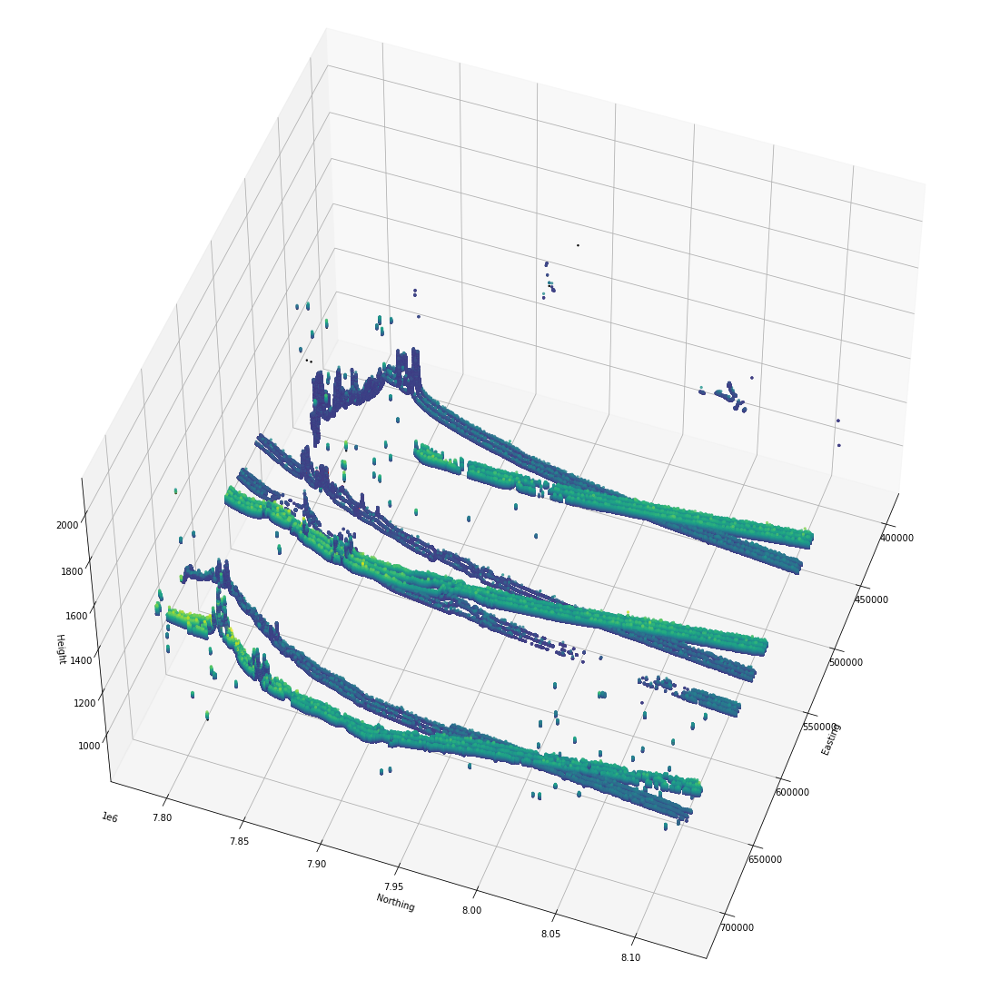

In [45]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection='3d')

#scatter plots

ax.scatter3D(df_Ground['Easting'], df_Ground['Northing'], df_Ground['Ground_Height'], 
             s=2, c='black', alpha=1)

ax.scatter3D(df_GrassHeight['Easting'], df_GrassHeight['Northing'],
             df_GrassHeight['Ground_interp_Height']+df_GrassHeight['Grass_Height'], 
             s=3, c='red', alpha=1)

ax.scatter3D(df_PreCanopy['Easting'], df_PreCanopy['Northing'], df_PreCanopy['Ground_interp_Height']+df_PreCanopy['PreCanopy_Height'],
             s=5, c=df_PreCanopy['PreCanopy_Height'], cmap='viridis', alpha=0.7)


ax.view_init(50, 20)
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Height')
plt.show()

## Steps 1 and 2 and start of 3: 

added set index to try and use iloc after to slice the data in windows. 

In [ ]:
from dateutil.relativedelta import *
from datetime import datetime
import dask.dataframe as dd


def select_df_period(directory, start_date, period:int, file_names):
    
    # Select period for time series
    start_date = datetime.strptime(start_date, '%m-%d-%Y').date()
    end_date = start_date+relativedelta(months=+period)
    
    df_list = []

    df_list = map(lambda file_name: dd.read_hdf(f'{directory}{file_name}*.hdf', '*').set_index('Easting', npartitions='auto').loc[lambda df: df.Date.between(f'{start_date}', f'{end_date}')], file_names)

    # Compute the results using multiple processes
    df_list = [df.compute(scheduler='processes') for df in df_list]

    return (df_list)

### Testing with different npartition values of set_index
1min 26s with npart='auto' -> tried with different position of the arg but this one was best and has best performance for varied inputs

2min 1s with npart=25

1min 59s with npart=35

1min 58s with npart=30

2min 1s with npart=50

2min 38s with npart=100

5min 59s with npart=1000

In [ ]:
%%time 
df_list = select_df_period(directory, start_date='10-14-2018', period=1, file_names=file_names)

In [ ]:
# Unpack the list of dataframes into separate variables

# df_Land, df_Ground, df_TOC, df_PreCanopy, df_GrassHeight = df_list
df_TOC, df_GrassHeight = df_list

---

# Testing Boxplots

In [2]:
from dateutil.relativedelta import *
from datetime import datetime
import dask.dataframe as dd
import matplotlib.pyplot as plt


def select_df_period(directory, start_date, period:int, file_names):
    
    # Select period for time series
    start_date = datetime.strptime(start_date, '%m-%d-%Y').date()
    end_date = start_date+relativedelta(months=+period)
    
    df_list = []

    # Create dask dataframe for data between desired period
    df_list = map(lambda file_name: dd.read_hdf(f'{directory}{file_name}*.hdf', '*').loc[lambda df: df.Date.between(f'{start_date}', f'{end_date}')], file_names)
   
    # Compute the results using multiple processes
    df_list = [df.compute(scheduler='processes') for df in df_list]

    return (df_list)

In [3]:
directory = '/DATA/magalhaes/icesat2_atl03/atl03_hdf_dates/'

file_names = ['ATL03_Ground', 'ATL03_TOC', 'ATL03_GrassHeight', 'ATL03_PreCanopy'] #period=1 5min

# file_names = ['ATL03_Land', 'ATL03_Ground', 'ATL03_TOC', 'ATL03_PreCanopy', 'ATL03_GrassHeight'] #period=1 50 min for all

# file_names = ['ATL03_TOC', 'ATL03_GrassHeight'] #period=1 13.9 sec for TOC and Grass

# file_names = 'ATL03_TOC'

In [4]:
%%time 
df_list = select_df_period(directory, start_date='10-14-2018', period=1, file_names=file_names)

CPU times: user 27.2 s, sys: 1.55 s, total: 28.8 s
Wall time: 5min 29s


In [11]:
# Unpack the list of dataframes into separate variables

df_Ground, df_TOC, df_GrassHeight, df_PreCanopy= df_list

# df_Ground, df_PreCanopy, df_GrassHeight = df_list

# df_TOC, df_GrassHeight = df_list

In [37]:
df_Ground

,Latitude,Longitude,alongtrack,crosstrack,Easting,Northing,Ground_Height,Date
0,-17.000096,15.857250,1.105780e+06,2305.967867,591251.217868,8.120235e+06,1134.145020,2018-10-14
1,-17.000385,15.857220,1.105812e+06,2305.938133,591247.960645,8.120203e+06,1134.417114,2018-10-14
2,-17.000633,15.857195,1.105840e+06,2305.910457,591245.175339,8.120175e+06,1134.895996,2018-10-14
3,-17.000970,15.857161,1.105877e+06,2305.888665,591241.364623,8.120138e+06,1135.560791,2018-10-14
4,-17.001222,15.857135,1.105905e+06,2305.908784,591238.477819,8.120110e+06,1135.913513,2018-10-14
...,...,...,...,...,...,...,...,...
5193,-19.992177,15.742495,2.223160e+06,1881.839457,577674.394652,7.789212e+06,1350.150879,2018-11-12
5194,-19.996818,15.741998,2.223676e+06,1882.780687,577620.096070,7.788699e+06,1352.468262,2018-11-12
5195,-19.998462,15.741823,2.223859e+06,1883.007045,577600.961747,7.788517e+06,1353.100098,2018-11-12
5196,-19.999258,15.741737,2.223947e+06,1883.260709,577591.558115,7.788429e+06,1353.275208,2018-11-12


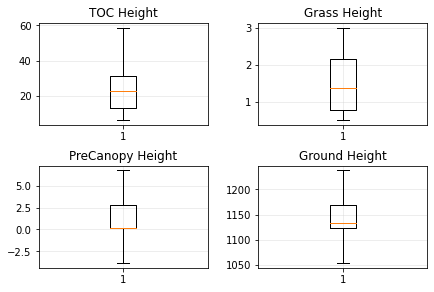

In [109]:
fig, axs = plt.subplots(2, 2)


axs[0, 0].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[0, 0].boxplot(df_TOC['TOC_Height']+df_TOC['TOC_Height'], 0, '')
axs[0, 0].set_title('TOC Height')

axs[0, 1].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[0, 1].boxplot(df_GrassHeight['Grass_Height'], 0, '')
axs[0, 1].set_title('Grass Height')

axs[1, 0].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[1, 0].boxplot(df_PreCanopy['PreCanopy_Height'], 0, '')
axs[1, 0].set_title('PreCanopy Height')

axs[1, 1].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[1, 1].boxplot(df_Ground['Ground_Height'], 0, '')
axs[1, 1].set_title('Ground Height')


fig.subplots_adjust(left=0.08, right=0.98, bottom=0.05, top=0.9,
                    hspace=0.4, wspace=0.3)
fig.savefig('../JupyterNotebooks/Boxplots/test.png')

Text(0.5, 0.98, 'Main title 01-14-2019 + 3 months')

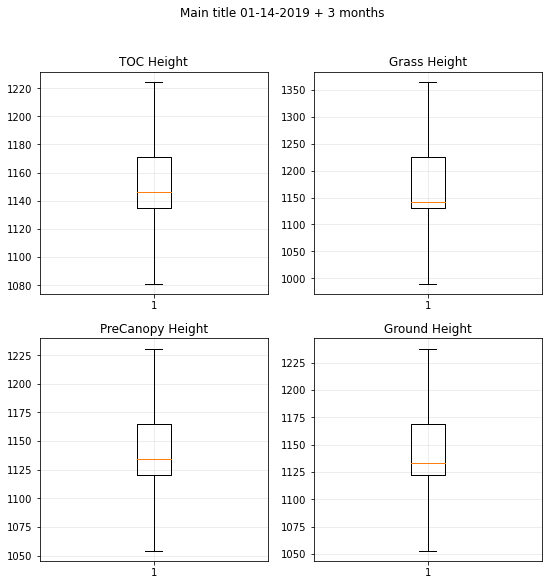

In [108]:
period=3

fig, axs = plt.subplots(2, 2, figsize=(9, 9))

axs[0, 0].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[0, 0].boxplot(df_TOC['TOC_Height']+df_TOC['Ground_interp_Height'], 0, '')
axs[0, 0].set_title('TOC Height')

axs[0, 1].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[0, 1].boxplot(df_GrassHeight['Grass_Height']+df_GrassHeight['Ground_interp_Height'], 0, '')
axs[0, 1].set_title('Grass Height')

axs[1, 0].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[1, 0].boxplot(df_PreCanopy['PreCanopy_Height']+df_PreCanopy['Ground_interp_Height'], 0, '')
axs[1, 0].set_title('PreCanopy Height')

axs[1, 1].grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)
axs[1, 1].boxplot(df_Ground['Ground_Height'], 0, '')
axs[1, 1].set_title('Ground Height')

fig.suptitle(f'Main title {start_date} + {period} months')

In [ ]:
# Import the datetime module and the relativedelta function
from datetime import datetime
from dateutil.relativedelta import relativedelta

# Set the start date and end date
start_date = '10-14-2018'
end_date = '03-13-2022'

# Parse the start date as a datetime object
start_date = datetime.strptime(start_date, '%m-%d-%Y')
end_date = datetime.strptime(end_date, '%m-%d-%Y')
# Set the number of months to add
num_months = 3
    
# Parse the start date as a datetime object
start_date = datetime.strptime(start_date, '%m-%d-%Y')
end_date = datetime.strptime(end_date, '%m-%d-%Y')

# Add the number of months to the start date until the new date is before the end date
while start_date < end_date:
    start_date += relativedelta(months=nmonths)
    # Convert the datetime object to a string in the specified format
    date_str = start_date.strftime('%m-%d-%Y')
    print(date_str)

---